# Introdução ao Processamento de Dados LiDAR

Este notebook demonstra as principais funcionalidades da biblioteca `lidarReadAndViewer.py` para processamento e visualização de dados LiDAR.

## Importando as bibliotecas necessárias

In [12]:
import os
import matplotlib.pyplot as plt

# Importar as classes do módulo lidar_utils
from lidar.lidarReadAndViewer import *

## 1. Carregamento de Dados LiDAR

Primeiro, vamos listar e selecionar arquivos LAS/LAZ disponíveis.

In [13]:
# Listar arquivos LAS/LAZ disponíveis no diretório "data"
las_files, data_dir = LidarFileHandler.list_las_files(data_dir="data")

if las_files:
    print(f"Arquivos LiDAR encontrados: {len(las_files)}")
    for i, file in enumerate(las_files):
        print(f"  {i+1}. {file}")
    
    # Criar widget para seleção de arquivos
    file_dropdown, selected_file_path = LidarFileHandler.create_file_selector(las_files, data_dir)
    display(file_dropdown)
else:
    print("Nenhum arquivo LiDAR (.las ou .laz) encontrado no diretório 'data'.")
    print("Por favor, adicione arquivos no diretório ou ajuste o caminho.")

Arquivos LiDAR encontrados: 6
  1. USGS_LPC_NE_Statewide_D23_13T_FG_7085.las
  2. USGS_LPC_NE_Statewide_D23_13T_FG_7085.laz
  3. USGS_LPC_NE_Statewide_D23_13T_GH_2362.las
  4. USGS_LPC_NE_Statewide_D23_13T_GH_2362.laz
  5. USGS_LPC_NE_Statewide_D23_13T_GH_3843.las
  6. USGS_LPC_NE_Statewide_D23_13T_GH_3843.laz


Dropdown(description='Select file:', options=('USGS_LPC_NE_Statewide_D23_13T_FG_7085.las', 'USGS_LPC_NE_Statew…

In [14]:
# Carregar o arquivo selecionado
# Execute esta célula após selecionar um arquivo no dropdown acima
las_data = LidarFileHandler.read_las_file(selected_file_path)


File loaded successfully!


## 2. Informações Básicas dos Dados LiDAR

In [15]:
# Exibir informações básicas sobre o arquivo
LidarInfo.print_basic_info(las_data)

LAS format version: 1.4
Total point count: 24636066
Data extent:
  X: 670000.00 to 671000.00
  Y: 4685000.00 to 4686000.00
  Z: 1174.95 to 1310.85

Available attributes:
  - X
  - Y
  - Z
  - intensity
  - return_number
  - number_of_returns
  - synthetic
  - key_point
  - withheld
  - overlap
  - scanner_channel
  - scan_direction_flag
  - edge_of_flight_line
  - classification
  - user_data
  - scan_angle
  - point_source_id
  - gps_time


## 3. Visualização dos Dados LiDAR

### 3.1 Visualização 2D

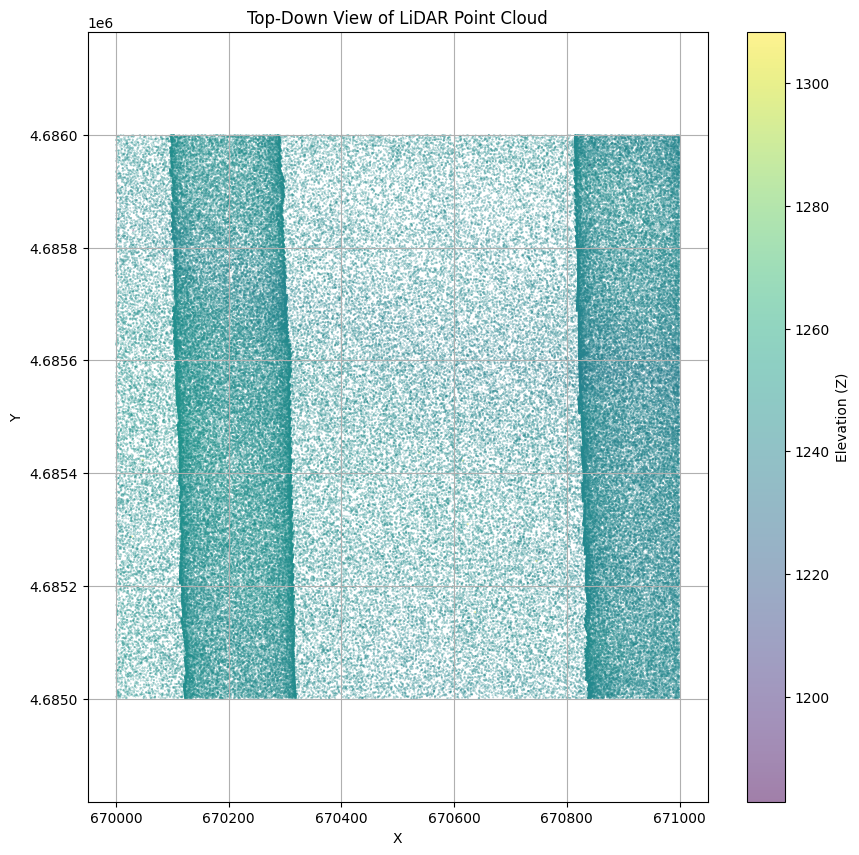

In [16]:
# Visualização 2D (vista superior)
LidarVisualization.plot_2d_view(las_data, max_points=200000, point_size=0.1)

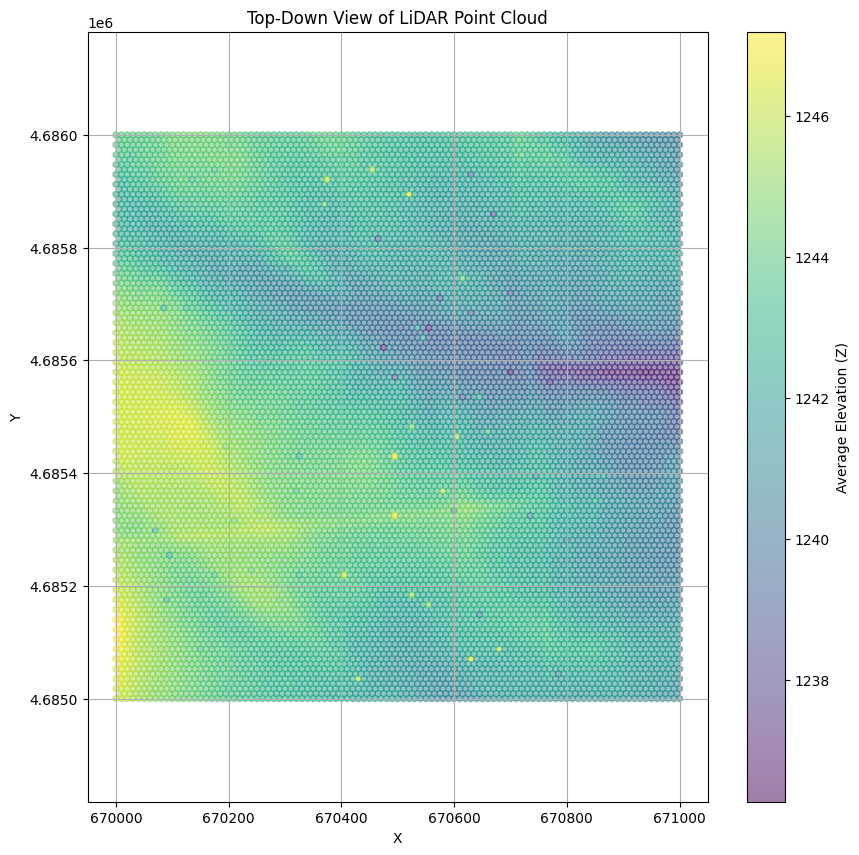

In [17]:
# Visualização 2D usando hexbin (alternativa para conjuntos densos)
LidarVisualization.plot_2d_view(las_data, max_points=500000, use_hexbin=True)

### 3.2 Histograma de Elevação

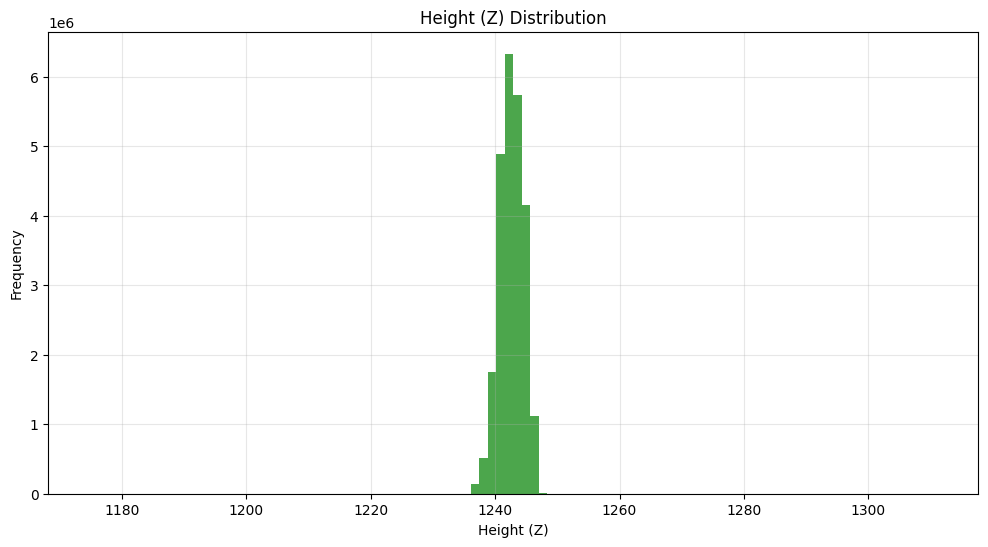

Height (Z) statistics:
  Minimum: 1174.95
  Maximum: 1310.85
  Mean: 1242.59
  Median: 1242.58
  Standard deviation: 1.97


In [18]:
# Histograma da distribuição de alturas
LidarVisualization.plot_elevation_histogram(las_data)

### 3.3 Visualização 3D Interativa

In [23]:
# Visualização 3D interativa com Plotly
fig_3d = LidarVisualization.plot_3d_plotly(las_data, max_points=300000, point_size=1, opacity=0.7)
fig_3d.show()

### 3.4 Visualização com Open3D

A próxima célula abrirá uma janela separada com o visualizador 3D do Open3D.

In [20]:
# Visualização com Open3D (abre uma janela separada)
# Comentário: Esta visualização permite uma navegação mais fluida na nuvem de pontos
# LidarVisualization.visualize_open3d(las_data, max_points=500000)

## 4. Análise de Atributos LiDAR

### 4.1 Análise de Intensidade

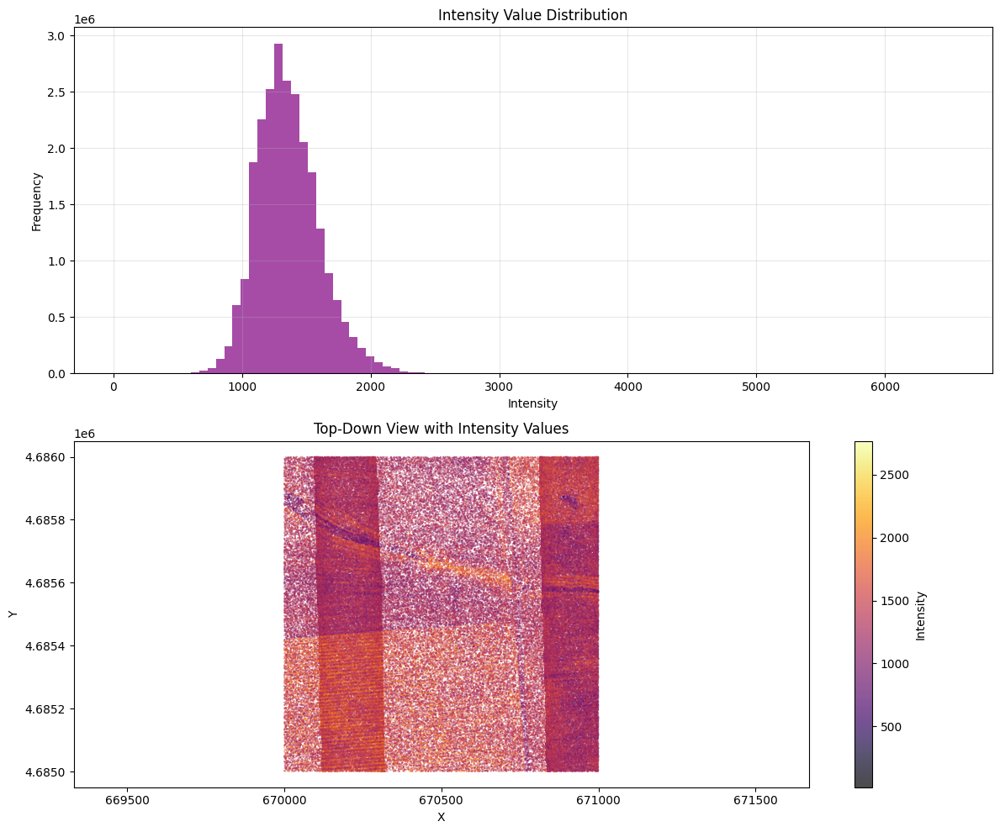

In [21]:
# Visualização da intensidade (se disponível no conjunto de dados)
LidarVisualization.plot_intensity(las_data, max_points=200000)

### 4.2 Análise de Classificação

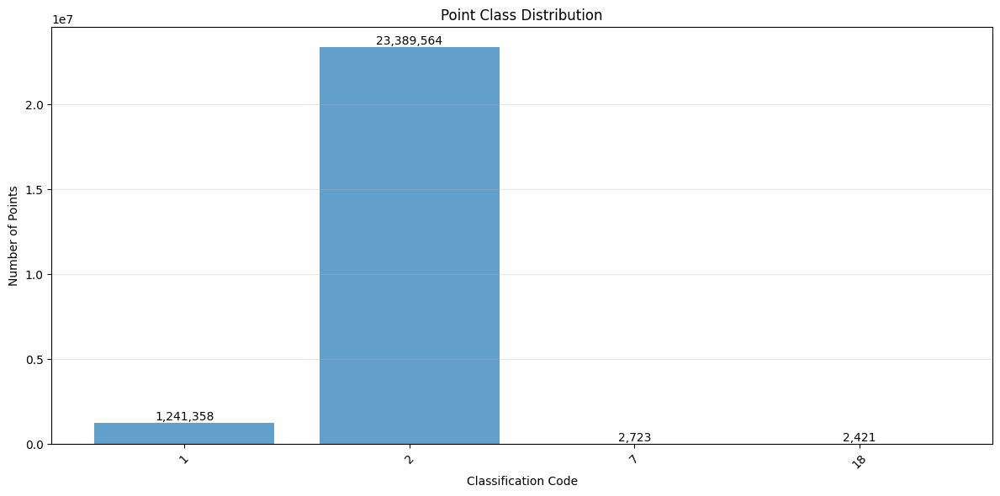


Classes identified in the dataset:
  Class 1 - Unclassified: 1,241,358 points (5.04%)
  Class 2 - Ground: 23,389,564 points (94.94%)
  Class 7 - Low Point (noise): 2,723 points (0.01%)
  Class 18 - High Noise: 2,421 points (0.01%)


In [22]:
# Estatísticas de classificação (se disponível no conjunto de dados)
LidarVisualization.plot_classification_stats(las_data)